# Data Visualisation

### What is with this file?

Here is the code I used to create my plots. Not very clean but it works.

In [156]:
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd
import dash as dash

# This ensures Plotly output works in multiple places:
# plotly_mimetype: VS Code notebook UI
# notebook: "Jupyter: Export to HTML" command in VS Code
# See https://plotly.com/python/renderers/#multiple-renderers
# CREDIT FROM congyiwu from https://github.com/microsoft/vscode-jupyter/issues/6999
import plotly.io as pio
pio.renderers.default = "plotly_mimetype+notebook"

In [157]:
data = pd.read_csv('VideoGamesSales.csv')
# read the data

In [158]:
# Statistics yeah

# now we analyse the data a bit
# It was just for my own discovery

print(data.info())
#16719 entries, 16 columns

print(data.describe())
# statistics of the data, min max is what I am mostly interested from here

print(data.head())
# some NaN values in the data
# Year, User count and Critic data is float, I'll change them to int

data['Year_of_Release'] = data['Year_of_Release'].astype('Int64')
data['User_Count'] = data['User_Count'].astype('Int64')
data['Critic_Count'] = data['Critic_Count'].astype('Int64')


pd.set_option('display.max_rows', None)
data.isnull().sum()
# a lot of NaN values in the data in critic ratings, user ratings
# whatever are Developer and Rating
# probably the publisher and developer are the same at the ones that the developer is missing

count = 0
for index in data.index:
    count = count + data['JP_Sales'][index] + data['EU_Sales'][index] + data['NA_Sales'][index] + data['Other_Sales'][index]

print(count)
print(data['Global_Sales'].sum())
# 1235 Publisher == Developer
# 15484 Publisher != Developer with NaNs

# data.dropna(subset=['Critic_Score', 'Publisher'], inplace=True)

sum = 0
for index in data.index:
    if data['Publisher'][index]=='Nintendo':
        sum = sum + data['Global_Sales'][index]

print("Total Global Sales Nintendo:", sum)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16719 entries, 0 to 16718
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16717 non-null  object 
 1   Platform         16719 non-null  object 
 2   Year_of_Release  16450 non-null  float64
 3   Genre            16717 non-null  object 
 4   Publisher        16665 non-null  object 
 5   NA_Sales         16719 non-null  float64
 6   EU_Sales         16719 non-null  float64
 7   JP_Sales         16719 non-null  float64
 8   Other_Sales      16719 non-null  float64
 9   Global_Sales     16719 non-null  float64
 10  Critic_Score     8137 non-null   float64
 11  Critic_Count     8137 non-null   float64
 12  User_Score       7590 non-null   float64
 13  User_Count       7590 non-null   float64
 14  Developer        10096 non-null  object 
 15  Rating           9950 non-null   object 
dtypes: float64(10), object(6)
memory usage: 2.0+ MB
None
     

In [159]:
data.isnull().sum()

Name                  2
Platform              0
Year_of_Release     269
Genre                 2
Publisher            54
NA_Sales              0
EU_Sales              0
JP_Sales              0
Other_Sales           0
Global_Sales          0
Critic_Score       8582
Critic_Count       8582
User_Score         9129
User_Count         9129
Developer          6623
Rating             6769
dtype: int64

In [160]:
total_sales = data[['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales']].sum()

fig = go.Figure(data=go.Bar(
    x=total_sales.index,
    y=total_sales.values,
    marker_color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728'], 
))

fig.update_layout(
    title='Video Game Sales Distribution by Region',
    xaxis=dict(title='Region'),
    yaxis=dict(title='Total Sales (in millions)'),
)

fig.show()

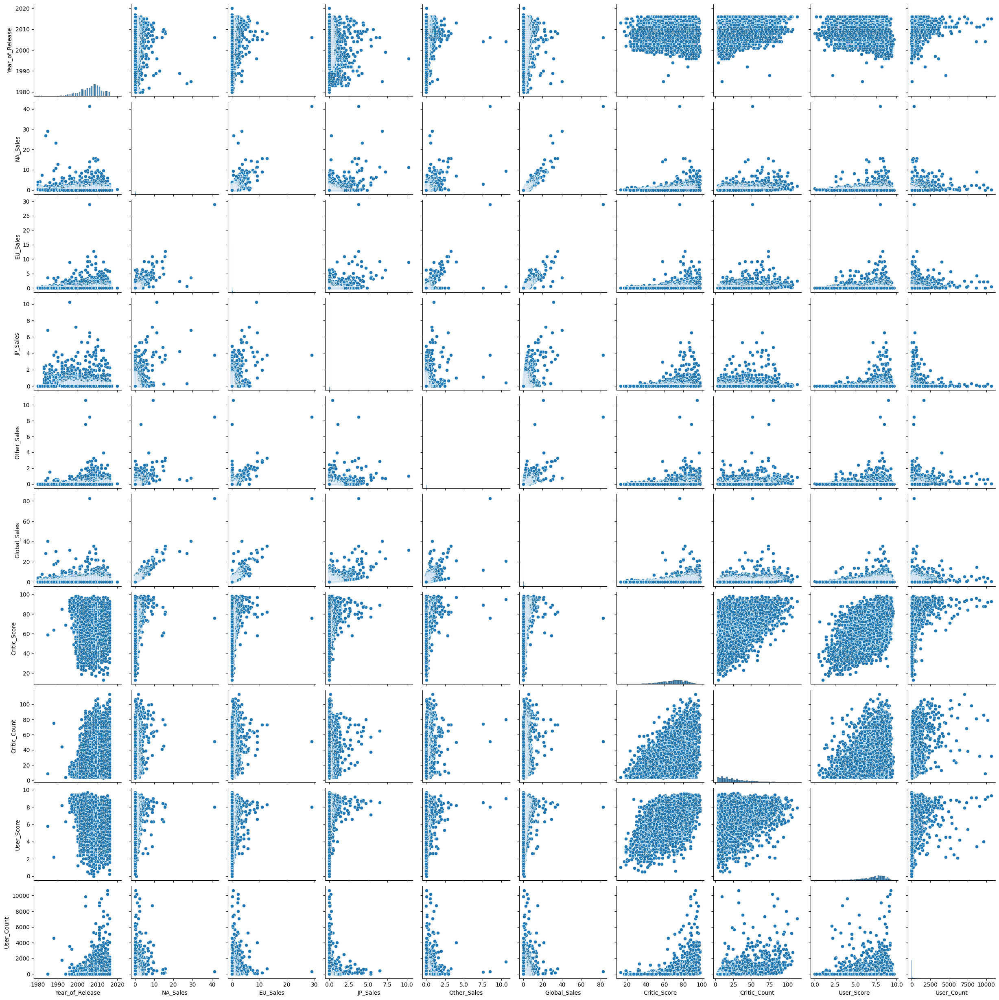

In [161]:
import seaborn as sns
import matplotlib.pyplot as plt

numerical_columns = ['Year_of_Release', 'NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales', 'Critic_Score', 'Critic_Count', 'User_Score', 'User_Count']

sns.pairplot(data[numerical_columns])

plt.show()

In [162]:
yearly_counts = data['Year_of_Release'].value_counts().sort_index().reset_index()
yearly_counts.columns = ['Year', 'Number of Games Released']

fig = px.line(yearly_counts, x='Year', y='Number of Games Released', title='Total Number of Games Released Each Year (1980 - 2020)', markers=True)
fig.update_layout(xaxis_title='Year of Release', yaxis_title='Number of Games Released')
fig.update_layout(width=1000, height=600)

fig.show()

In [163]:
yearly_counts = data['Year_of_Release'].value_counts().sort_index().reset_index()
yearly_counts.columns = ['Year', 'Number of Games Released']

fig = px.bar(yearly_counts, x='Year', y='Number of Games Released', title='Total Number of Games Released Each Year (1980 - 2020)')
fig.update_layout(xaxis_title='Year of Release', yaxis_title='Number of Games Released')
fig.update_layout(width=1000, height=600)

fig.show()

In [164]:
count_2017 = 0
count_2018 = 0
count_2019 = 0
count_2020 = 0

for index in data.index:
    if pd.Series(data['Year_of_Release'][index]).notnull().bool():
        if data['Year_of_Release'][index] == 2017:
            count_2017 += 1
        elif data['Year_of_Release'][index] == 2018:
            count_2018 += 1
        elif data['Year_of_Release'][index] == 2019:
            count_2019 += 1
        elif data['Year_of_Release'][index] == 2020:
            count_2020 += 1

print("Games released in 2017:", count_2017)
print("Games released in 2018:", count_2018)
print("Games released in 2019:", count_2019)
print("Games released in 2020:", count_2020)

C:\Users\jstge\AppData\Local\Temp\ipykernel_2544\3633535417.py:7: FutureWarning:

Series.bool is now deprecated and will be removed in future version of pandas



Games released in 2017: 3
Games released in 2018: 0
Games released in 2019: 0
Games released in 2020: 1


In [165]:
years = [2017, 2018, 2019, 2020]
counts = [3, 0, 0, 1]

df = pd.DataFrame({'Year': years, 'Games Released': counts})

fig = go.Figure(data=go.Bar(
    x=df['Year'],
    y=df['Games Released'],
    #marker_color='blue' 
))

fig.update_layout(
    title='Total Number of Games Released Each Year (2017 - 2020)',
    xaxis_title='Year of Release', 
    yaxis_title='Number of Games Released'
)

fig.update_layout(width=600, height=500)

fig.show()

In [166]:
filtered_data = data.dropna(subset=['Critic_Score', 'User_Score'])

fig = px.scatter(filtered_data, x='Critic_Score', y='User_Score', hover_data=['Name'],
                 title='Critic Score vs User Score')

fig.update_traces(marker=dict(size=8),
                  selector=dict(mode='markers'))

fig.update_layout(xaxis_title='Critic Score', yaxis_title='User Score')

fig.show()


In [167]:
publisher_scores = data.groupby('Publisher').agg({'Critic_Score': 'mean', 'User_Score': 'mean'}).reset_index()

fig = px.scatter(publisher_scores, x='Critic_Score', y='User_Score',
                 title='Mean Critic Score vs Mean User Score per Publisher',
                 hover_data={'Publisher': True, 'Critic_Score': True, 'User_Score': True})

fig.update_traces(marker=dict(size=8),
                  selector=dict(mode='markers'))

fig.update_layout(xaxis_title='Mean Critic Score', yaxis_title='Mean User Score',
                  hovermode='closest', hoverlabel=dict(bgcolor="white", font_size=12))

fig.update_layout(width=800, height=600)

fig.show()



In [168]:
publisher_sales = data.groupby('Publisher')['Global_Sales'].sum().reset_index()

top_publishers = publisher_sales.nlargest(10, 'Global_Sales')

fig = px.bar(top_publishers, x='Global_Sales', y='Publisher', orientation='h',
             title='Top 10 Publishers by Global Sales',
             labels={'Global_Sales': 'Total Global Sales', 'Publisher': 'Publisher'})

fig.update_layout(xaxis_title='Total Global Sales', yaxis_title='Publisher', yaxis_categoryorder='total ascending',
                  yaxis={'categoryorder': 'total ascending'}, width=800, height=350)

fig.show()



In [169]:
publisher_games = data.groupby('Publisher')['Name'].count().reset_index()
publisher_games.columns = ['Publisher', 'Number of Games']

top_publishers_games = publisher_games.nlargest(10, 'Number of Games')

fig = px.bar(top_publishers_games, x='Number of Games', y='Publisher', orientation='h',
             title='Top 10 Publishers by Number of Games Released',
             labels={'Number of Games': 'Number of Games Released', 'Publisher': 'Publisher'})

for index, row in top_publishers_games.iterrows():
    fig.add_annotation(x=row['Number of Games'], y=row['Publisher'], text=row['Number of Games'],
                       font=dict(color='white', size=12), showarrow=False, xshift=-20)

fig.update_layout(xaxis_title='Number of Games Released', yaxis_title='Publisher', yaxis_categoryorder='total ascending',
                  yaxis={'categoryorder': 'total ascending'}, width=800, height=350)

fig.show()


In [170]:
publisher_sales = data.groupby('Publisher')['Global_Sales'].sum().reset_index()
top_publishers = publisher_sales.nlargest(10, 'Global_Sales')
publisher_games = data.groupby('Publisher')['Name'].count().reset_index()
publisher_games.columns = ['Publisher', 'Number of Games']
top_publishers_games = publisher_games.nlargest(10, 'Number of Games')
merged_data = pd.merge(top_publishers, top_publishers_games, on='Publisher', how='outer')

fig = go.Figure()

fig.add_trace(go.Bar(
    y=merged_data['Publisher'],
    x=merged_data['Global_Sales'],
    name='Global Sales',
    orientation='h',
    marker_color='#942158'
))

fig.add_trace(go.Bar(
    y=merged_data['Publisher'],
    x=merged_data['Number of Games'],
    name='Number of Games Released',
    orientation='h',
    marker_color='#d6590f'
))

fig.update_layout(
    barmode='group',
    title='Top 10 Publishers by Global Sales and their Number of Games Released',
    xaxis_title='Value* (*- in million units for Global Sales)',
    yaxis_title='Publishers',
    yaxis=dict(categoryorder='total ascending'),
    legend=dict(x=0.1, y=1.1, orientation='h'),
    height=600,
    width=1000 
)

fig.show()

In [171]:
publisher_sales = data.groupby('Publisher')['Global_Sales'].sum().reset_index()
top_publishers = publisher_sales.nlargest(10, 'Global_Sales')
publisher_games = data.groupby('Publisher')['Name'].count().reset_index()
publisher_games.columns = ['Publisher', 'Number of Games']
top_publishers_games = publisher_games.nlargest(10, 'Number of Games')
merged_data = pd.merge(top_publishers, top_publishers_games, on='Publisher', how='outer')


fig = px.scatter(merged_data, x='Number of Games', y='Global_Sales', text='Publisher',
                 title='Top 10 Publishers: Number of Games vs Global Sales',
                 labels={'Number of Games': 'Number of Games Released', 'Global_Sales': 'Total Global Sales (milion units)'})

fig.update_traces(marker=dict(size=12, color='blue'), mode='markers', textfont=dict(size=10))

fig.update_layout(width=800, height=600)

fig.show()


In [172]:
top_10_publishers = merged_data.nlargest(10, 'Global_Sales')['Publisher']
top_10_data = data[data['Publisher'].isin(top_10_publishers)]
region_sales = top_10_data.groupby('Publisher')[['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales']].sum().reset_index()
region_sales_melted = region_sales.melt(id_vars='Publisher', value_vars=['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales'],
                                        var_name='Region', value_name='Sales')


fig = px.bar(region_sales_melted, x='Publisher', y='Sales', color='Region', barmode='stack',
             title='Top 10 Publishers: Sales by Region',
             labels={'Sales': 'Total Sales', 'Region': 'Region'})

fig.update_layout(xaxis_title='Publisher', yaxis_title='Total Sales', legend_title='Region')
fig.update_layout(width=800, height=600)

fig.show()


In [173]:
fig = go.Figure()

fig.add_trace(go.Box(y=data['NA_Sales'], name='NA Sales', marker_color='skyblue'))
fig.add_trace(go.Box(y=data['EU_Sales'], name='EU Sales', marker_color='salmon'))
fig.add_trace(go.Box(y=data['JP_Sales'], name='JP Sales', marker_color='lightgreen'))
fig.add_trace(go.Box(y=data['Other_Sales'], name='Other Sales', marker_color='lightcoral'))

fig.update_layout(
    title='Box Plot of Sales by Region',
    xaxis_title='Region',
    yaxis_title='Sales',
    boxmode='group'
)
fig.update_layout(width=1000, height=600)

fig.show()


In [174]:
# I NEED TO REMOVE OUTLIERS WTF
def remove_outliers(series):
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return series[(series >= lower_bound) & (series <= upper_bound)]

temp_data = data.copy()
temp_data['NA_Sales'] = remove_outliers(temp_data['NA_Sales'])
temp_data['EU_Sales'] = remove_outliers(temp_data['EU_Sales'])
temp_data['JP_Sales'] = remove_outliers(temp_data['JP_Sales'])
temp_data['Other_Sales'] = remove_outliers(temp_data['Other_Sales'])




In [175]:
fig = go.Figure()

fig.add_trace(go.Box(y=temp_data['NA_Sales'], name='NA Sales', marker_color='skyblue'))
fig.add_trace(go.Box(y=temp_data['EU_Sales'], name='EU Sales', marker_color='salmon'))
fig.add_trace(go.Box(y=temp_data['JP_Sales'], name='JP Sales', marker_color='lightgreen'))
fig.add_trace(go.Box(y=temp_data['Other_Sales'], name='Other Sales', marker_color='lightcoral'))

fig.update_layout(
    title='Box Plot of Sales by Region',
    xaxis_title='Region',
    yaxis_title='Sales',
    boxmode='group' 
)
fig.update_layout(width=1000, height=600)

fig.show()


In [176]:
print(data[['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales']].describe())

           NA_Sales      EU_Sales      JP_Sales   Other_Sales
count  16719.000000  16719.000000  16719.000000  16719.000000
mean       0.263330      0.145025      0.077602      0.047332
std        0.813514      0.503283      0.308818      0.186710
min        0.000000      0.000000      0.000000      0.000000
25%        0.000000      0.000000      0.000000      0.000000
50%        0.080000      0.020000      0.000000      0.010000
75%        0.240000      0.110000      0.040000      0.030000
max       41.360000     28.960000     10.220000     10.570000


In [177]:
fig = go.Figure(data=[go.Histogram(x=data['NA_Sales'], nbinsx=30)])

fig.update_layout(
    title='Distribution of NA Sales',
    xaxis_title='NA Sales',
    yaxis_title='Frequency'
)

fig.show()


In [178]:
fig = px.scatter(data, x='Global_Sales', y='Name', title='Global Sales vs. Games',
                 labels={'Global_Sales': 'Global Sales', 'Name': 'Games'})

fig.update_traces(marker=dict(size=2))
fig.update_yaxes(showticklabels=False)

fig.show()


In [179]:
filtered_data = data[data['Global_Sales'] > 20]

fig = px.scatter(filtered_data, x='Name', y='Global_Sales', title='Global Sales vs. Games (Sales > 20)',
                 labels={'Name': 'Games', 'Global_Sales': 'Global Sales'})

fig.update_traces(marker=dict(size=2))
fig.update_xaxes(showticklabels=False)
fig.update_layout(title_x=0.5)

fig.show()

In [180]:
bins = list(range(0, 81))  # Range from 0 to 80, inclusive

fig = go.Figure()

fig.add_trace(go.Histogram(x=data['Global_Sales'], 
                           xbins=dict(start=0, end=80, size=0.1),
                           marker_color='blue'))

fig.update_layout(
    title='Histogram of Global Sales',
    xaxis_title='Global Sales',
    yaxis_title='Count',
)

fig.show()


In [181]:
first_appearance = data.groupby('Publisher')['Year_of_Release'].min().reset_index()
first_appearance = first_appearance.sort_values(by='Year_of_Release')

fig = px.scatter(first_appearance, x='Year_of_Release', y='Publisher', 
                 title='First Appearance of Publishers Over Time',
                 labels={'Year_of_Release': 'Year', 'Publisher': 'Publisher'})

fig.update_layout(xaxis_title='Year', yaxis_title='Publisher')

fig.show()

In [182]:
first_appearance = data.groupby('Publisher')['Year_of_Release'].min().reset_index()
global_sales = data.groupby('Publisher')['Global_Sales'].sum().reset_index()
merged_data = pd.merge(first_appearance, global_sales, on='Publisher', how='inner')

fig = px.scatter(merged_data, x='Year_of_Release', y='Global_Sales', hover_name='Publisher',
                 title='First Appearance of Publisher vs. Global Sales by Publisher',
                 labels={'Year_of_Release': 'First Appearance Year', 'Global_Sales': 'Global Sales'},
                 size_max=2) 

fig.update_layout(xaxis_title='Year of First Appearance of a Publisher', yaxis_title='Global Sales')

fig.update_layout(width=1000, height=600)

fig.show()
